In [101]:
from pycocotools.coco import COCO
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import pickle
import json
import torchvision.transforms.functional as F
import torch
from PIL import Image, ImageDraw, ImageFont, ImageColor

In [2]:
from maskrcnn_benchmark.config import cfg
from maskrcnn_benchmark.modeling.detector import build_detection_model
from maskrcnn_benchmark.utils.checkpoint import DetectronCheckpointer
from maskrcnn_benchmark.data import make_data_loader

## Setup

In [16]:
cd ..

/home/hammad/gaila/rcnn_ov


In [17]:
pwd

'/home/hammad/gaila/rcnn_ov'

In [11]:
config_file = 'configs/mmss_rcnn_v03_4x_cur_rs_ulb.yaml'

cuda_device_no = 0
device = "cuda:{}".format(cuda_device_no)

ckpt = '/dvmm-filer3a/users/rahul/rcnn-ov/outputs/expts/gt-cur_cass_prevk-s-no_pretrained_wgts_no_th_1_1/model_final.pth'
ckpt_no_cur = '/dvmm-filer3a/users/rahul/rcnn-ov/outputs/expts/gt-no_cur-s-no_pretrained_wgts_no_th_1_1/model_final.pth'

In [12]:
cfg.merge_from_file(config_file)
cfg.INFERENCE.DO = False
cfg.TEST.IMS_PER_BATCH = 1

cfg_no_cur = cfg.clone()
cfg_no_cur.MODEL.MMSS_HEAD.GROUNDING.ALIGNMENT_CURRICULUM = ""
cfg_no_cur.CURRICULUM.DO = False

In [13]:
model = build_detection_model(cfg)
model_no_cur = build_detection_model(cfg_no_cur)

model.to(device)
model_no_cur.to(device)

checkpointer = DetectronCheckpointer(cfg, model, save_dir='')
_ = checkpointer.load(ckpt, use_latest=False)

checkpointer_no_cur = DetectronCheckpointer(cfg_no_cur, model_no_cur, save_dir='')
_ = checkpointer_no_cur.load(ckpt_no_cur, use_latest=False)

In [18]:
data_loader = make_data_loader(cfg, is_train=False, is_distributed=False, is_inference=True)[0]

loading annotations into memory...
Done (t=0.32s)
creating index...
index created!
loading annotations into memory...
Done (t=1.82s)
creating index...
index created!


In [52]:
emb_mtx = data_loader.dataset.class_emb_mtx if cfg.DATASETS.DATASET_ARGS.LOAD_EMBEDDINGS else None

model.set_class_list(data_loader.dataset.contiguous_class_list)
model.set_class_embeddings(emb_mtx)
if not model.pretrained_class_emb:
    model.need_cls_embedding_reset = 1
    model.reset_class_embeddings()
    
model_no_cur.set_class_list(data_loader.dataset.contiguous_class_list)
model_no_cur.set_class_embeddings(emb_mtx)
if not model_no_cur.pretrained_class_emb:
    model_no_cur.need_cls_embedding_reset = 1
    model_no_cur.reset_class_embeddings()
    
objects_by_phases = data_loader.dataset.objects_by_phases
contiguous_id2cat_id = data_loader.dataset.contiguous_category_id_to_json_id
cat_id2name = data_loader.dataset.categories

## Inference

In [122]:
def draw_bounding_boxes(
    image: torch.Tensor,
    boxes: torch.Tensor,
    labels  = None,
    colors  = None,
    fill = False,
    width: int = 1,
    font = None,
    font_size: int = 10
) -> torch.Tensor:

    """
    Draws bounding boxes on given image.
    The values of the input image should be uint8 between 0 and 255.
    If fill is True, Resulting Tensor should be saved as PNG image.

    Args:
        image (Tensor): Tensor of shape (C x H x W) and dtype uint8.
        boxes (Tensor): Tensor of size (N, 4) containing bounding boxes in (xmin, ymin, xmax, ymax) format. Note that
            the boxes are absolute coordinates with respect to the image. In other words: `0 <= xmin < xmax < W` and
            `0 <= ymin < ymax < H`.
        labels (List[str]): List containing the labels of bounding boxes.
        colors (List[Union[str, Tuple[int, int, int]]]): List containing the colors of bounding boxes. The colors can
            be represented as `str` or `Tuple[int, int, int]`.
        fill (bool): If `True` fills the bounding box with specified color.
        width (int): Width of bounding box.
        font (str): A filename containing a TrueType font. If the file is not found in this filename, the loader may
            also search in other directories, such as the `fonts/` directory on Windows or `/Library/Fonts/`,
            `/System/Library/Fonts/` and `~/Library/Fonts/` on macOS.
        font_size (int): The requested font size in points.

    Returns:
        img (Tensor[C, H, W]): Image Tensor of dtype uint8 with bounding boxes plotted.
    """

    if not isinstance(image, torch.Tensor):
        raise TypeError(f"Tensor expected, got {type(image)}")
    elif image.dtype != torch.uint8:
        raise ValueError(f"Tensor uint8 expected, got {image.dtype}")
    elif image.dim() != 3:
        raise ValueError("Pass individual images, not batches")

    ndarr = image.permute(1, 2, 0).numpy()
    img_to_draw = Image.fromarray(ndarr)

    img_boxes = boxes.to(torch.int64).tolist()

    if fill:
        draw = ImageDraw.Draw(img_to_draw, "RGBA")

    else:
        draw = ImageDraw.Draw(img_to_draw)

    txt_font = ImageFont.load_default() if font is None else ImageFont.truetype(font=font, size=font_size)

    for i, bbox in enumerate(img_boxes):
        if colors is None:
            color = None
        elif isinstance(colors, list):
            color = colors[i]
        else:
            color = colors

        if fill:
            if color is None:
                fill_color = (255, 255, 255, 100)
            elif isinstance(color, str):
                # This will automatically raise Error if rgb cannot be parsed.
                fill_color = ImageColor.getrgb(color) + (100,)
            elif isinstance(color, tuple):
                fill_color = color + (100,)
            draw.rectangle(bbox, width=width, outline=color, fill=fill_color)
        else:
            draw.rectangle(bbox, width=width, outline=color)

        if labels is not None:
            margin = width + 1
            draw.text((bbox[0] + margin, bbox[1] + margin), labels[i], fill=color, font=txt_font)

    return torch.from_numpy(np.array(img_to_draw)).permute(2, 0, 1).to(torch.uint8)

In [126]:
pixel_std = torch.tensor(cfg.INPUT.PIXEL_STD).unsqueeze(1).unsqueeze(2)
pixel_mean = torch.tensor(cfg.INPUT.PIXEL_MEAN).unsqueeze(1).unsqueeze(2)

def viz_img_and_bbox(img_tensor, boxes, box_names):
    img_tensor_unnrmlzd = img_tensor * pixel_std + pixel_mean
#     print(img_tensor_unnrmlzd.shape)
    img_tensor_unnrmlzd_rgb = img_tensor_unnrmlzd[[2,1,0]] 
    I = F.to_pil_image(img_tensor_unnrmlzd_rgb / 255)
    plt.axis('off')
    plt.imshow(I)
    plt.show()
    
    img_with_bbox = draw_bounding_boxes(img_tensor_unnrmlzd.to(torch.uint8), boxes, width=4, labels=box_names)
    I_with_bbox = F.to_pil_image(img_with_bbox)
    plt.axis('off')
    plt.imshow(np.asarray(I_with_bbox))
    plt.show()

In [24]:
model.set_phased_inference(True)
model.eval()

model_no_cur.set_phased_inference(True)
model_no_cur.eval()

print('')

MMSSRegionModel(
  (backbone): Sequential(
    (body): ResNet(
      (stem): StemWithFixedBatchNorm(
        (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        (bn1): FrozenBatchNorm2d()
      )
      (layer1): Sequential(
        (0): BottleneckWithFixedBatchNorm(
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d()
          )
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d()
        )
        (1): BottleneckWithFixedBatchNorm(
          (conv1): Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): Fro

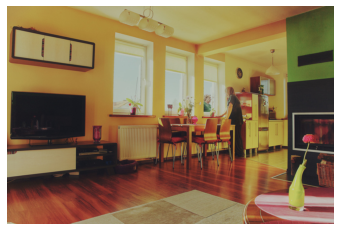

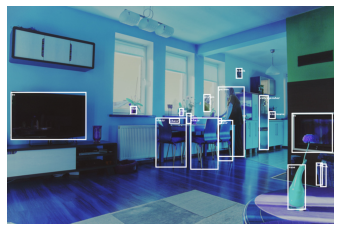

Category name to check:  tv
Our Model
Category:  tv  ; Correctness:  [True, True]
Category:  chair  ; Correctness:  [True, True, False, False, False]
Category:  person  ; Correctness:  [False, False]
Category:  microwave  ; Correctness:  [False]
Category:  refrigerator  ; Correctness:  [True]
Category:  book  ; Correctness:  [True, True]
Category:  clock  ; Correctness:  [False]
Category:  vase  ; Correctness:  [False, False, False, False]

OVR-CNN
Category:  tv  ; Correctness:  [True, True]
Category:  chair  ; Correctness:  [False, False, False, False, False]
Category:  person  ; Correctness:  [False, False]
Category:  microwave  ; Correctness:  [False]
Category:  refrigerator  ; Correctness:  [True]
Category:  book  ; Correctness:  [False, False]
Category:  clock  ; Correctness:  [False]
Category:  vase  ; Correctness:  [False, False, False, False]
tv tensor([ 13.1922, 315.0422, 291.5240, 491.3239])
tv tensor([1045.6394,  392.8451, 1196.4211,  538.8169])
chair tensor([673.6484, 409.4

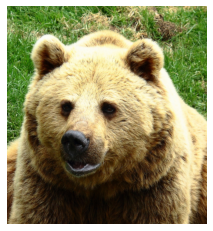

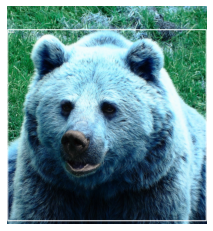

Category name to check:  bear
Our Model
Category:  bear  ; Correctness:  [True]

OVR-CNN
Category:  bear  ; Correctness:  [True]
bear tensor([  1.9522,  93.8611, 798.6348, 861.7465])


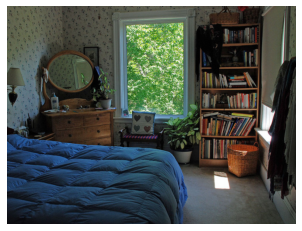

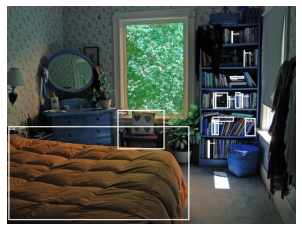

Category name to check:  bed
Our Model
Category:  bed  ; Correctness:  [False]
Category:  book  ; Correctness:  [True, True, True, True, True, False, False, True, True, True, False, False, True]
Category:  chair  ; Correctness:  [False]

OVR-CNN
Category:  bed  ; Correctness:  [False]
Category:  book  ; Correctness:  [False, True, True, True, True, False, False, True, True, True, False, False, True]
Category:  chair  ; Correctness:  [False]
bed tensor([  5.4159, 441.9876, 668.2969, 785.2589])
book tensor([755.2169, 318.8406, 767.7547, 376.1325])
book tensor([750.7947, 418.9979, 762.4216, 473.5404])
book tensor([736.6338, 492.9690, 743.7888, 557.0352])
book tensor([837.9797, 316.3893, 856.4470, 375.6522])
book tensor([807.4385, 330.1532, 818.1710, 374.9565])
chair tensor([405.4831, 381.6977, 577.2694, 525.2837])
book tensor([763.3822, 317.4659, 810.3037, 375.5031])
book tensor([872.8769, 411.7102, 911.6332, 477.0186])
book tensor([860.2397, 320.3810, 865.3410, 375.3540])
book tensor([82

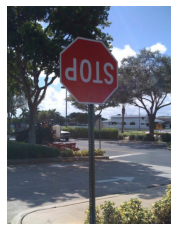

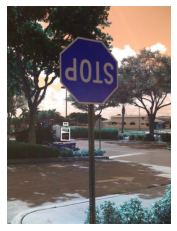

Category name to check:  truck
Our Model
Category:  truck  ; Correctness:  [True]
Category:  car  ; Correctness:  [False]

OVR-CNN
Category:  truck  ; Correctness:  [True]
Category:  car  ; Correctness:  [False]
truck tensor([263.2320, 595.7661, 307.4774, 657.9565])
car tensor([273.6213, 569.6917, 298.9654, 584.9355])


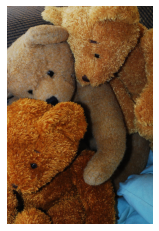

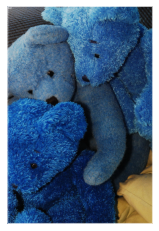

Category name to check:  bed
Our Model
Category:  bed  ; Correctness:  [False]

OVR-CNN
Category:  bed  ; Correctness:  [False]
bed tensor([2.6729e+00, 2.6162e-01, 7.9813e+02, 1.1941e+03])


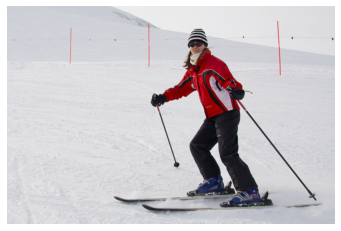

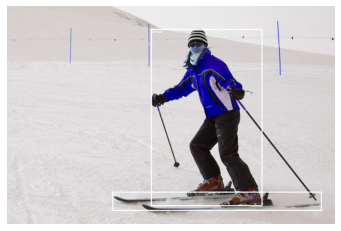

Category name to check:  person
Our Model
Category:  person  ; Correctness:  [False]
Category:  skis  ; Correctness:  [True]

OVR-CNN
Category:  person  ; Correctness:  [False]
Category:  skis  ; Correctness:  [True]
person tensor([528.2362,  84.1976, 937.7843, 734.8894])
skis tensor([ 386.2959,  681.8071, 1155.2004,  751.8306])


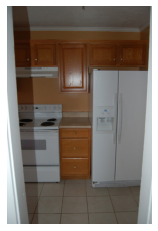

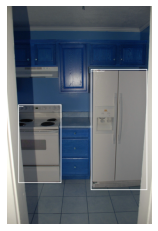

Category name to check:  refrigerator
Our Model
Category:  refrigerator  ; Correctness:  [True]
Category:  oven  ; Correctness:  [False]

OVR-CNN
Category:  refrigerator  ; Correctness:  [True]
Category:  oven  ; Correctness:  [False]
refrigerator tensor([ 462.3585,  349.3322,  773.2264, 1018.8966])
oven tensor([ 62.4151, 545.1868, 299.3207, 979.9897])


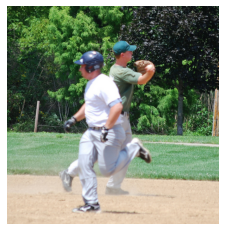

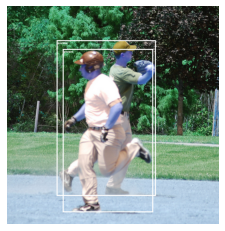

Category name to check:  person
Our Model
Category:  person  ; Correctness:  [False, False]

OVR-CNN
Category:  person  ; Correctness:  [True, False]
person tensor([187.1304, 129.6126, 561.9453, 717.1633])
person tensor([210.9243, 162.7657, 551.9098, 779.9933])


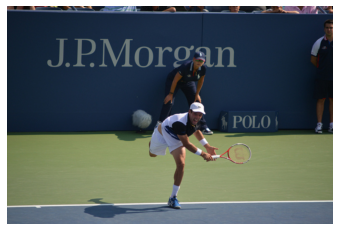

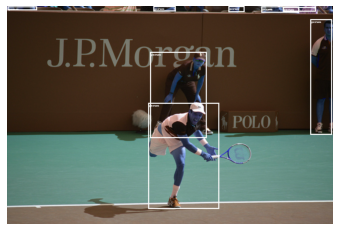

Category name to check:  person
Our Model
Category:  person  ; Correctness:  [False, True, False, False, False, False, False, False]

OVR-CNN
Category:  person  ; Correctness:  [False, True, True, False, False, False, False, False]
person tensor([519.5229, 355.9532, 780.0994, 744.1874])
person tensor([526.4734, 168.2623, 734.1064, 484.0468])
person tensor([1115.9692,   48.2998, 1195.3468,  472.6183])
person tensor([8.1438e+02, 6.1827e-01, 8.7394e+02, 2.2482e+01])
person tensor([5.3841e+02, 3.5597e-01, 6.2018e+02, 1.9953e+01])
person tensor([1015.1783,    3.2412, 1136.6520,   20.3279])
person tensor([  2.0795,   1.0492, 110.6265,  15.8314])
person tensor([ 935.7258,    1.4239, 1074.6787,   24.6183])


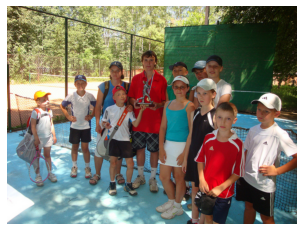

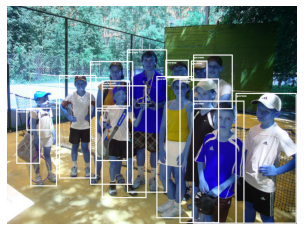

Category name to check:  person
Our Model
Category:  handbag  ; Correctness:  [False, False]
Category:  person  ; Correctness:  [True, False, False, False, False, False, False, False, False, False, False, False]
Category:  backpack  ; Correctness:  [False, False]

OVR-CNN
Category:  handbag  ; Correctness:  [False, False]
Category:  person  ; Correctness:  [False, False, False, False, False, False, False, False, False, False, False, False]
Category:  backpack  ; Correctness:  [False, False]
handbag tensor([ 34.2119, 377.8500, 121.3075, 578.7333])
handbag tensor([327.9782, 373.9167, 443.3394, 568.1667])
person tensor([191.8134, 253.5500, 328.7777, 632.5667])
person tensor([676.1271, 200.7000, 736.3062, 274.9000])
person tensor([441.9402, 159.7667, 588.3820, 684.5667])
person tensor([348.4987, 291.0667, 512.7793, 704.5333])
person tensor([ 840.5910,  319.9167, 1064.3344,  798.3333])
person tensor([683.2394, 347.5500, 872.9541, 798.3333])
person tensor([634.3533, 266.5167, 779.9955, 796.9

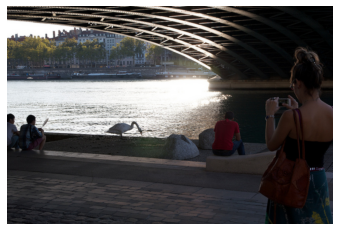

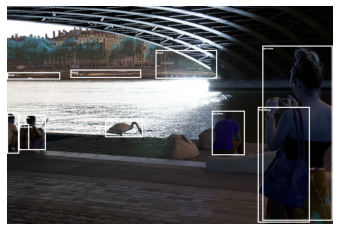

Category name to check:  bird
Our Model
Category:  bird  ; Correctness:  [False]
Category:  boat  ; Correctness:  [True, True, False]
Category:  person  ; Correctness:  [False, True, False, False]
Category:  backpack  ; Correctness:  [False]
Category:  handbag  ; Correctness:  [False]

OVR-CNN
Category:  bird  ; Correctness:  [False]
Category:  boat  ; Correctness:  [True, True, False]
Category:  person  ; Correctness:  [True, True, True, False]
Category:  backpack  ; Correctness:  [False]
Category:  handbag  ; Correctness:  [False]
bird tensor([361.2175, 421.1710, 499.3460, 481.9298])
boat tensor([233.7488, 233.6487, 493.2948, 263.7564])
boat tensor([  0.0000, 243.0164, 195.6618, 269.5082])
person tensor([ 43.5949, 399.8314, 142.0066, 528.1124])
person tensor([ 939.8661,  145.4988, 1197.1266,  787.5785])
person tensor([753.7589, 384.1124, 874.1459, 547.9532])
person tensor([  0.0000, 391.9063,  44.8688, 541.0398])
backpack tensor([ 40.8597, 433.3490,  81.2323, 528.0562])
handbag tenso

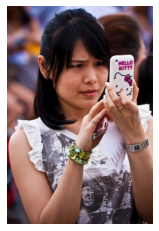

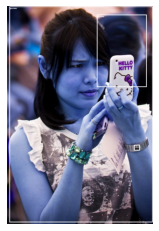

Category name to check:  clock
Our Model
Category:  clock  ; Correctness:  [False]
Category:  person  ; Correctness:  [False, False]

OVR-CNN
Category:  clock  ; Correctness:  [False]
Category:  person  ; Correctness:  [False, False]
clock tensor([696.0750, 764.8496, 727.0445, 794.0939])
person tensor([  13.4145,    2.9413,  798.1265, 1189.3331])
person tensor([492.0656,  47.4354, 765.5270, 445.2224])


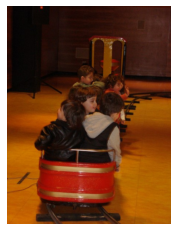

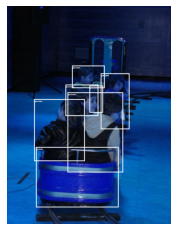

Category name to check:  train
Our Model
Category:  train  ; Correctness:  [False]
Category:  person  ; Correctness:  [False, False, False, False, False, False]

OVR-CNN
Category:  train  ; Correctness:  [False]
Category:  person  ; Correctness:  [False, False, False, False, False, False]
train tensor([141.4187, 689.9152, 544.3840, 984.8135])
person tensor([457.8347, 329.3513, 597.5894, 602.4819])
person tensor([317.6747, 291.0606, 476.6080, 401.0505])
person tensor([295.6374, 422.3705, 566.6774, 813.6778])
person tensor([132.5013, 455.8856, 379.3067, 758.3738])
person tensor([285.8027, 384.9326, 445.9307, 537.8184])
person tensor([402.4107, 389.6870, 468.5654, 521.2953])


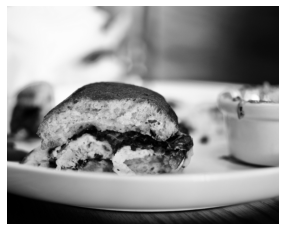

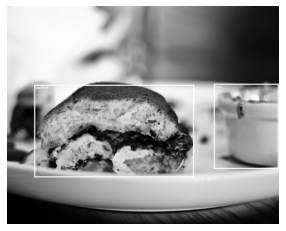

Category name to check:  sandwich
Our Model
Category:  sandwich  ; Correctness:  [False]
Category:  bowl  ; Correctness:  [False]

OVR-CNN
Category:  sandwich  ; Correctness:  [False]
Category:  bowl  ; Correctness:  [False]
sandwich tensor([100.4531, 289.0000, 687.2344, 628.2500])
bowl tensor([760.5312, 285.2031, 998.4375, 597.5469])


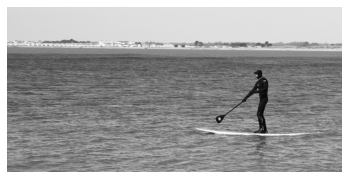

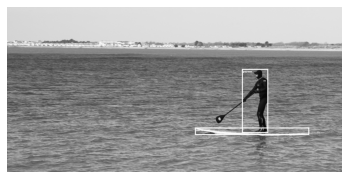

Category name to check:  person
Our Model
Category:  person  ; Correctness:  [False]
Category:  surfboard  ; Correctness:  [False]

OVR-CNN
Category:  person  ; Correctness:  [False]
Category:  surfboard  ; Correctness:  [True]
person tensor([ 934.2106,  246.4894, 1038.0651,  500.2052])
surfboard tensor([ 747.6266,  479.5881, 1201.1101,  508.8061])


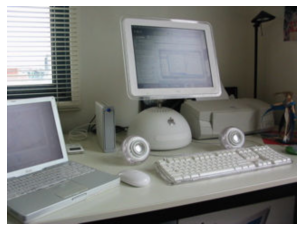

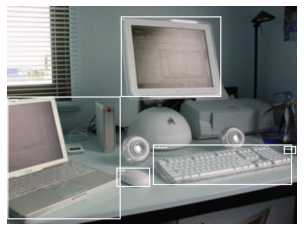

Category name to check:  laptop
Our Model
Category:  laptop  ; Correctness:  [True]
Category:  mouse  ; Correctness:  [False, False]
Category:  keyboard  ; Correctness:  [False]
Category:  tv  ; Correctness:  [False]

OVR-CNN
Category:  laptop  ; Correctness:  [True]
Category:  mouse  ; Correctness:  [False, False]
Category:  keyboard  ; Correctness:  [False]
Category:  tv  ; Correctness:  [True]
laptop tensor([  1.7989, 332.6000, 417.0725, 782.3000])
mouse tensor([402.9480, 593.2333, 525.4380, 663.4333])
keyboard tensor([ 536.7643,  508.1333, 1047.4783,  656.5333])
tv tensor([418.6049,  38.2000, 787.1744, 333.3000])
mouse tensor([1017.8634,  514.6333, 1062.5021,  543.5000])


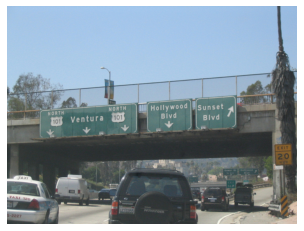

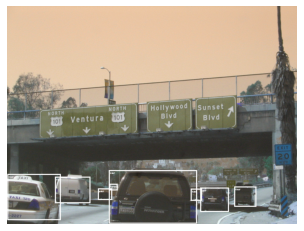

Category name to check:  car
Our Model
Category:  car  ; Correctness:  [True, False, False, False, False, False, True]
Category:  truck  ; Correctness:  [False]

OVR-CNN
Category:  car  ; Correctness:  [True, False, True, False, True, False, True]
Category:  truck  ; Correctness:  [False]
car tensor([  1.7989, 616.0833, 197.7597, 785.2000])
car tensor([835.3109, 662.4833, 916.6601, 736.6666])
car tensor([334.0911, 669.1666, 386.8081, 711.2000])
car tensor([176.8727, 626.1833, 306.9414, 723.8333])
truck tensor([375.7150, 652.0167, 406.7456, 676.4167])
car tensor([710.1226, 666.1500, 815.5066, 755.8833])
car tensor([675.7941, 670.0000, 716.5352, 714.7000])
car tensor([374.8489, 602.8333, 698.6298, 798.3333])


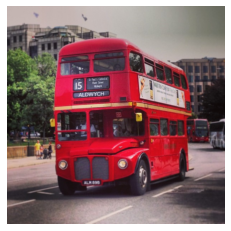

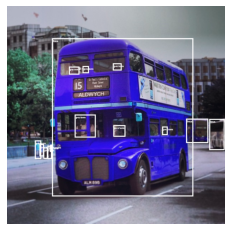

Category name to check:  bus
Our Model
Category:  bus  ; Correctness:  [True, False, True]
Category:  person  ; Correctness:  [False, False, False, False, False, False, False, False, False, False, False]

OVR-CNN
Category:  bus  ; Correctness:  [True, False, True]
Category:  person  ; Correctness:  [False, False, False, False, False, False, False, False, False, False, False]
bus tensor([165.0196, 118.3922, 683.8954, 698.2484])
person tensor([248.7974, 398.4052, 325.1111, 482.9935])
person tensor([569.4510, 442.0523, 589.3464, 473.2026])
person tensor([390.7321, 437.5294, 434.9935, 479.9608])
person tensor([227.9869, 222.6013, 265.0458, 251.2941])
person tensor([388.4706, 210.1307, 420.2745, 236.1046])
person tensor([158.6405, 509.4510, 166.4445, 535.8170])
bus tensor([742.7974, 414.2745, 798.6928, 528.0916])
person tensor([119.2157, 507.9608, 135.2157, 551.7647])
person tensor([277.5164, 220.6275, 300.3399, 246.1700])
person tensor([102.0654, 493.6078, 125.7647, 561.2026])
person tenso

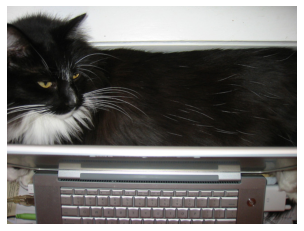

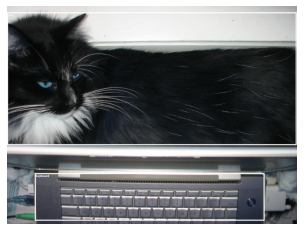

Category name to check:  cat
Our Model
Category:  cat  ; Correctness:  [False]
Category:  keyboard  ; Correctness:  [False]

OVR-CNN
Category:  cat  ; Correctness:  [False]
Category:  keyboard  ; Correctness:  [False]
cat tensor([   0.0000,   23.3500, 1064.3344,  510.9500])
keyboard tensor([102.4026, 613.0333, 946.9577, 787.5500])


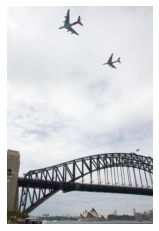

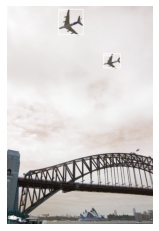

Category name to check:  airplane
Our Model
Category:  airplane  ; Correctness:  [False, True]
Category:  person  ; Correctness:  [False, False, False, False, False]

OVR-CNN
Category:  airplane  ; Correctness:  [False, False]
Category:  person  ; Correctness:  [False, False, False, False, False]
airplane tensor([528.7682, 261.1197, 622.8572, 341.2654])
airplane tensor([281.3489,  16.1678, 418.2857, 158.9050])
person tensor([  21.7518, 1153.9626,   28.9461, 1173.7274])
person tensor([   8.0187, 1154.6931,   19.6721, 1171.1606])
person tensor([  29.1897, 1152.1078,   38.9883, 1174.3080])
person tensor([  67.8970, 1172.2848,   75.0164, 1183.9750])
person tensor([  39.8689, 1156.0983,   51.7283, 1174.1582])


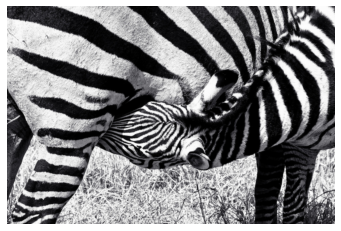

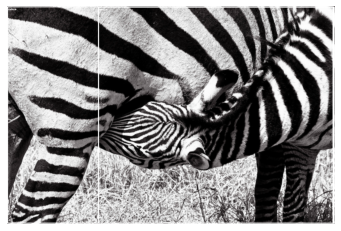

Category name to check:  zebra
Our Model
Category:  zebra  ; Correctness:  [True, True]

OVR-CNN
Category:  zebra  ; Correctness:  [True, True]
zebra tensor([ 334.9377,    2.7106, 1202.1188,  798.1177])
zebra tensor([   0.0000,    1.9576, 1198.3186,  798.1177])


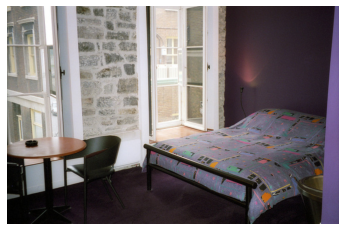

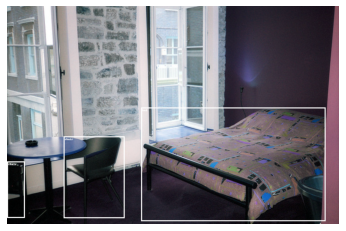

Category name to check:  bed
Our Model
Category:  bed  ; Correctness:  [True]
Category:  chair  ; Correctness:  [False, False]

OVR-CNN
Category:  bed  ; Correctness:  [True]
Category:  chair  ; Correctness:  [True, False]
bed tensor([ 493.9899,  372.1432, 1171.1106,  789.0978])
chair tensor([208.3713, 478.2053, 432.8063, 778.3103])
chair tensor([  0.0000, 570.2720,  65.1518, 777.0883])


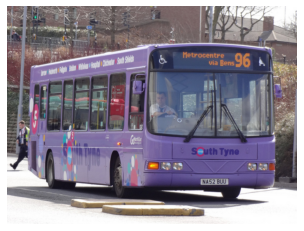

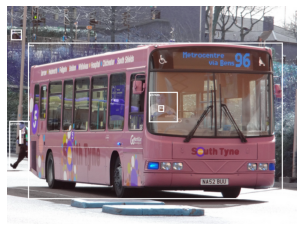

Category name to check:  bus
Our Model
Category:  bus  ; Correctness:  [True]
Category:  person  ; Correctness:  [False, False, False]
Category:  tie  ; Correctness:  [False, False]

OVR-CNN
Category:  bus  ; Correctness:  [True]
Category:  person  ; Correctness:  [False, False, False]
Category:  tie  ; Correctness:  [False, False]
bus tensor([  77.2517,  134.8333, 1013.4329,  708.4500])
person tensor([521.5238, 315.8833, 627.7906, 426.1167])
person tensor([  8.7112, 421.6500,  83.2146, 600.7500])
tie tensor([556.9017, 364.9000, 577.9219, 388.8500])
tie tensor([ 45.5548, 454.4666,  52.1507, 505.9833])
person tensor([ 15.5569,  86.4833,  54.0995, 125.0333])


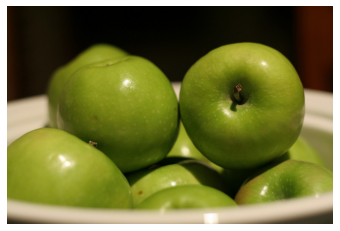

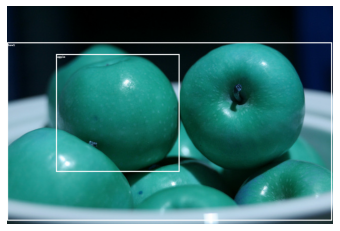

Category name to check:  bowl
Our Model
Category:  bowl  ; Correctness:  [False]
Category:  apple  ; Correctness:  [True]

OVR-CNN
Category:  bowl  ; Correctness:  [False]
Category:  apple  ; Correctness:  [True]
bowl tensor([   0.0000,  133.0398, 1195.3656,  787.3350])
apple tensor([180.6930, 176.9368, 634.3272, 608.0001])


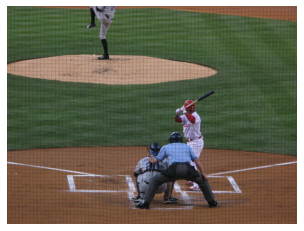

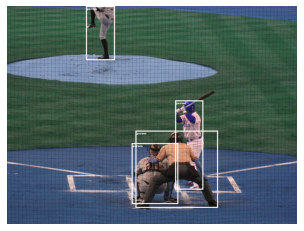

Category name to check:  person
Our Model
Category:  person  ; Correctness:  [False, False, False, False]

OVR-CNN
Category:  person  ; Correctness:  [False, False, False, False]
person tensor([472.0381, 457.9500, 775.0320, 740.0666])
person tensor([618.9796, 346.3500, 721.0823, 673.4833])
person tensor([290.8847,   0.0000, 396.9518, 198.2500])
person tensor([458.7131, 503.6667, 629.9227, 726.2500])


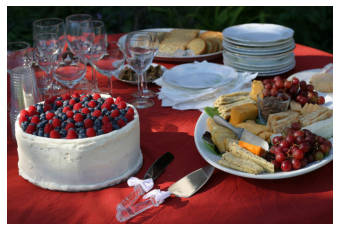

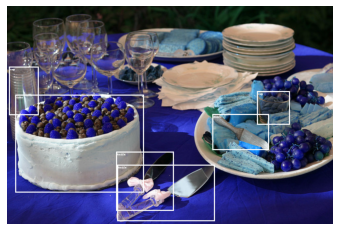

Category name to check:  knife
Our Model
Category:  knife  ; Correctness:  [False, False, False]
Category:  cake  ; Correctness:  [True]
Category:  cup  ; Correctness:  [False, False]

OVR-CNN
Category:  knife  ; Correctness:  [False, True, False]
Category:  cake  ; Correctness:  [True]
Category:  cup  ; Correctness:  [False, False]
knife tensor([401.8149, 534.8759, 613.8505, 751.2505])
knife tensor([755.6885, 396.8150, 963.6963, 528.5059])
cake tensor([ 30.5558, 325.0960, 503.2615, 684.5715])
cup tensor([  7.1940, 222.9134, 116.7714, 400.8244])
cup tensor([ 919.6892,  312.5246, 1040.6383,  435.2412])
knife tensor([405.0185, 582.4824, 764.3063, 789.4332])


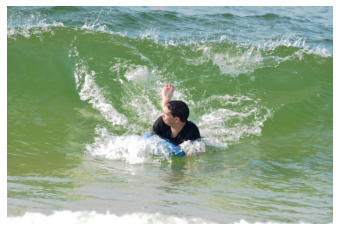

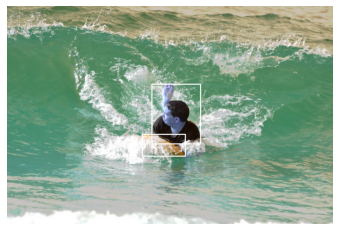

Category name to check:  person
Our Model
Category:  person  ; Correctness:  [False]
Category:  surfboard  ; Correctness:  [False]

OVR-CNN
Category:  person  ; Correctness:  [True]
Category:  surfboard  ; Correctness:  [True]
person tensor([531.4005, 285.3021, 713.7609, 507.2225])
surfboard tensor([496.5921, 469.6019, 657.1082, 552.9180])


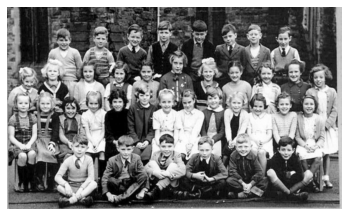

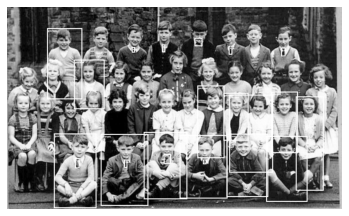

Category name to check:  tie
Our Model
Category:  tie  ; Correctness:  [False, False, False, False, False, False, False, False, False]
Category:  person  ; Correctness:  [False, False, False, False, False, False, False, False, False, False, False, False, False]

OVR-CNN
Category:  tie  ; Correctness:  [True, False, False, False, False, False, False, True, False]
Category:  person  ; Correctness:  [True, False, False, False, False, False, False, False, False, False, False, False, False]
tie tensor([269.4075, 599.8146, 286.6989, 639.0993])
tie tensor([876.2232, 156.8212, 890.1781, 191.6821])
tie tensor([1083.9323,  164.2119, 1100.8000,  198.6755])
tie tensor([493.1900, 161.0066, 505.7945, 183.8411])
person tensor([185.8366, 502.0132, 353.1902, 796.1589])
person tensor([370.4552, 504.7682, 558.5692, 787.7086])
person tensor([540.9070, 496.1854, 712.5768, 761.4039])
person tensor([682.3366, 508.7682, 871.4303, 758.1987])
person tensor([ 867.9879,  503.3643, 1032.4553,  752.3973])
person te

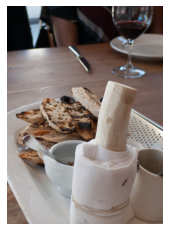

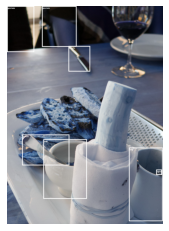

Category name to check:  knife
Our Model
Category:  cup  ; Correctness:  [True, False]
Category:  knife  ; Correctness:  [False]
Category:  spoon  ; Correctness:  [False, False]
Category:  person  ; Correctness:  [False, False]

OVR-CNN
Category:  cup  ; Correctness:  [False, False]
Category:  knife  ; Correctness:  [True]
Category:  spoon  ; Correctness:  [False, False]
Category:  person  ; Correctness:  [False, False]
cup tensor([186.7309, 684.8625, 409.5405, 990.8676])
cup tensor([ 625.9256,  727.2125,  798.2495, 1105.8950])
knife tensor([315.7987, 205.2750, 426.9234, 336.0700])
spoon tensor([ 77.8818, 660.9050, 319.0022, 818.6325])
spoon tensor([765.0765, 840.1400, 794.0481, 867.1775])
person tensor([179.6236,   0.0000, 356.7090, 209.4400])
person tensor([  0.0000,   0.0000, 139.2210, 236.0750])


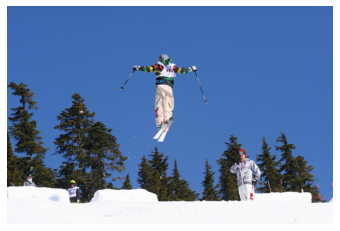

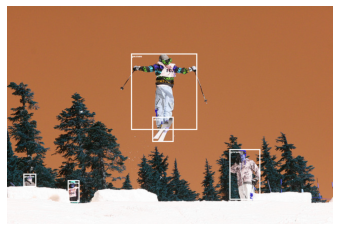

Category name to check:  person
Our Model
Category:  person  ; Correctness:  [False, False, False, False]
Category:  skis  ; Correctness:  [True]

OVR-CNN
Category:  person  ; Correctness:  [False, False, False, False]
Category:  skis  ; Correctness:  [False]
person tensor([456.6129, 174.3888, 699.2043, 454.7635])
person tensor([818.4112, 525.6768, 931.9415, 710.8947])
person tensor([223.0515, 639.2319, 266.0843, 719.9625])
person tensor([ 60.6806, 615.9438, 107.0857, 663.5504])
skis tensor([534.7166, 406.4637, 612.9326, 498.0609])


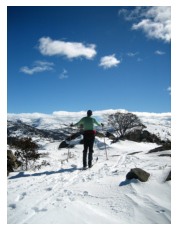

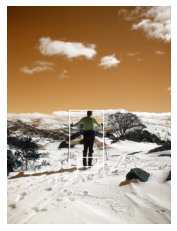

Category name to check:  person
Our Model
Category:  person  ; Correctness:  [False]
Category:  skis  ; Correctness:  [True]

OVR-CNN
Category:  person  ; Correctness:  [False]
Category:  skis  ; Correctness:  [True]
person tensor([304.9333, 508.8151, 472.4500, 787.7407])
skis tensor([343.6167, 738.3383, 442.1833, 817.7552])


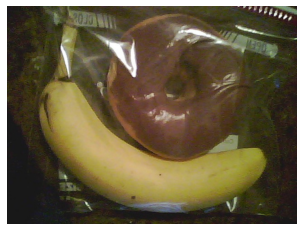

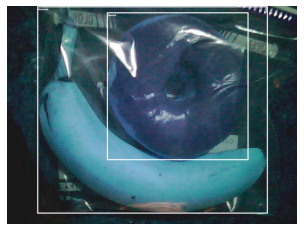

Category name to check:  banana
Our Model
Category:  banana  ; Correctness:  [True]
Category:  donut  ; Correctness:  [False]

OVR-CNN
Category:  banana  ; Correctness:  [True]
Category:  donut  ; Correctness:  [False]
banana tensor([111.3757,   1.6213, 958.0782, 761.0454])
donut tensor([367.3436,  23.4240, 887.4023, 565.4401])


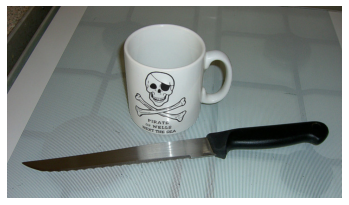

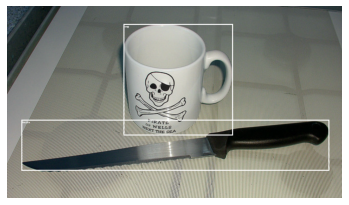

Category name to check:  knife
Our Model
Category:  cup  ; Correctness:  [False]
Category:  knife  ; Correctness:  [False]

OVR-CNN
Category:  cup  ; Correctness:  [False]
Category:  knife  ; Correctness:  [False]
cup tensor([463.8898,  71.9111, 898.3091, 513.3298])
knife tensor([  57.9420,  451.4954, 1281.6962,  653.6336])


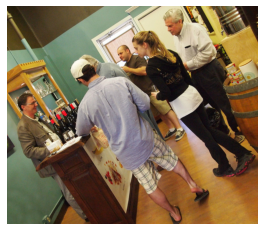

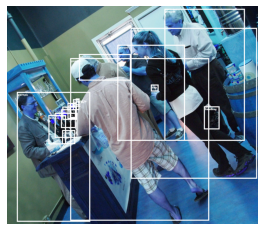

Category name to check:  bottle
Our Model
Category:  bottle  ; Correctness:  [False, False, False, False, False, False, False, False]
Category:  person  ; Correctness:  [False, False, False, False, True, False]
Category:  cup  ; Correctness:  [False, False]
Category:  handbag  ; Correctness:  [False]

OVR-CNN
Category:  bottle  ; Correctness:  [False, False, False, False, False, False, False, False]
Category:  person  ; Correctness:  [False, False, False, False, False, False]
Category:  cup  ; Correctness:  [False, False]
Category:  handbag  ; Correctness:  [False]
bottle tensor([152.4037, 400.3604, 216.0217, 507.2000])
bottle tensor([175.3961, 392.7784, 258.4913, 483.8054])
bottle tensor([198.1435, 379.7189, 252.4983, 447.9567])
bottle tensor([230.8890, 357.9964, 256.8202, 410.2486])
bottle tensor([242.1114, 342.8757, 265.7521, 381.5927])
bottle tensor([203.0561, 369.0090, 254.4576, 417.4414])
bottle tensor([252.1814, 339.8342, 266.0402, 362.1045])
person tensor([454.5748,  80.8937, 9

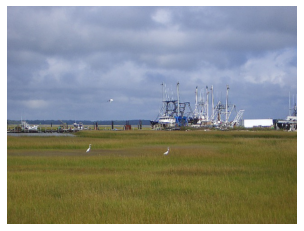

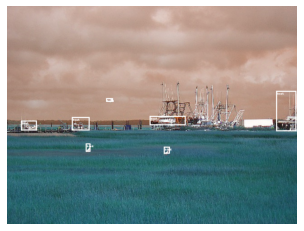

Category name to check:  bird
Our Model
Category:  bird  ; Correctness:  [False, False, False]
Category:  boat  ; Correctness:  [False, False, True, False]

OVR-CNN
Category:  bird  ; Correctness:  [False, False, False]
Category:  boat  ; Correctness:  [False, False, False, False]
bird tensor([576.0877, 516.5013, 598.6442, 541.8667])
bird tensor([289.3550, 504.5760, 306.6882, 534.5707])
bird tensor([364.3588, 338.7520, 389.8149, 351.8933])
boat tensor([524.9837, 403.3067, 656.8052, 437.7387])
boat tensor([238.8480, 407.9573, 303.0638, 456.1494])
boat tensor([ 51.9782, 420.2027, 109.1797, 456.2774])
boat tensor([ 989.9515,  311.9147, 1063.8680,  459.0080])


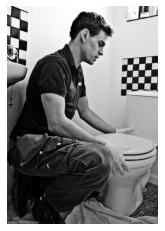

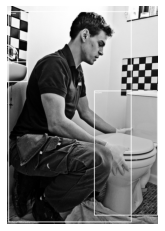

Category name to check:  person
Our Model
Category:  person  ; Correctness:  [False]
Category:  sink  ; Correctness:  [True]
Category:  toilet  ; Correctness:  [True]

OVR-CNN
Category:  person  ; Correctness:  [False]
Category:  sink  ; Correctness:  [True]
Category:  toilet  ; Correctness:  [True]
person tensor([   7.8014,   28.6223,  659.3770, 1145.3990])
sink tensor([  0.0000, 294.0738, 108.3702, 402.2288])
toilet tensor([ 461.2731,  448.0317,  798.1942, 1109.0345])


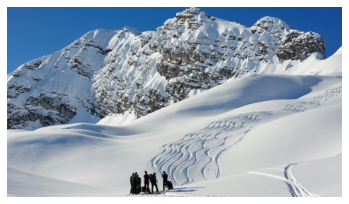

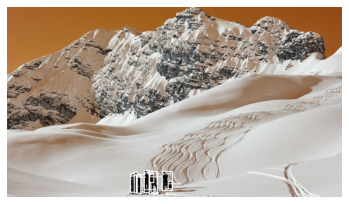

Category name to check:  person
Our Model
Category:  person  ; Correctness:  [False, False, False, False, False, False]
Category:  skis  ; Correctness:  [False]
Category:  backpack  ; Correctness:  [False, False, False]

OVR-CNN
Category:  person  ; Correctness:  [False, False, False, False, False, False]
Category:  skis  ; Correctness:  [False]
Category:  backpack  ; Correctness:  [False, False, False]
person tensor([512.0707, 666.3422, 533.7782, 742.1505])
person tensor([544.0596, 649.5561, 566.3290, 740.8176])
person tensor([564.4974, 653.1799, 599.9203, 744.9620])
person tensor([615.8627, 653.2424, 659.0902, 732.3204])
skis tensor([574.6956, 735.3610, 602.8549, 743.5875])
backpack tensor([536.1300, 715.0969, 547.0774, 736.0691])
backpack tensor([565.8711, 664.1971, 585.2891, 700.1643])
person tensor([489.4475, 661.3438, 507.1590, 738.9223])
backpack tensor([639.4641, 692.3961, 658.3618, 725.0311])
person tensor([504.9737, 656.9495, 519.6257, 741.5048])


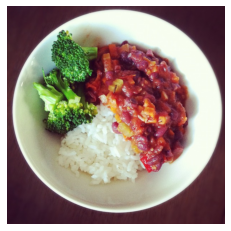

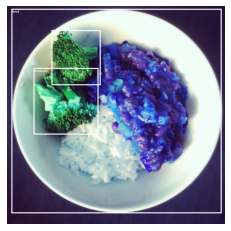

Category name to check:  broccoli
Our Model
Category:  broccoli  ; Correctness:  [True, True]
Category:  bowl  ; Correctness:  [True]

OVR-CNN
Category:  broccoli  ; Correctness:  [True, True]
Category:  bowl  ; Correctness:  [True]
broccoli tensor([163.7647,  88.4706, 343.1634, 290.4576])
broccoli tensor([ 97.8824, 227.7647, 335.6340, 471.1634])
bowl tensor([ 16.1830,  10.7843, 787.9085, 760.9412])


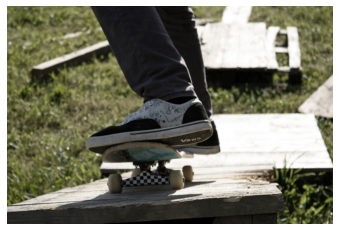

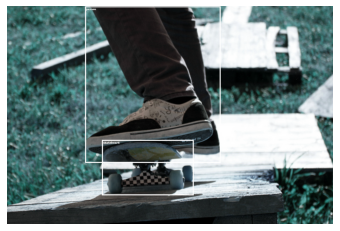

Category name to check:  person
Our Model
Category:  person  ; Correctness:  [False]
Category:  skateboard  ; Correctness:  [False]

OVR-CNN
Category:  person  ; Correctness:  [False]
Category:  skateboard  ; Correctness:  [False]
person tensor([287.1230,   1.3489, 785.4387, 575.5504])
skateboard tensor([349.7520, 491.6909, 686.8771, 694.2951])


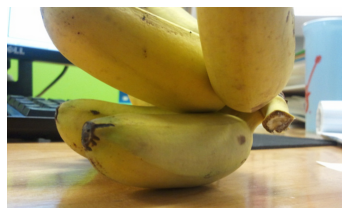

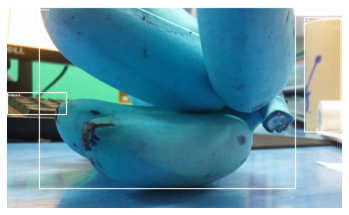

Category name to check:  banana
Our Model
Category:  banana  ; Correctness:  [True]
Category:  keyboard  ; Correctness:  [False]
Category:  cup  ; Correctness:  [False]

OVR-CNN
Category:  banana  ; Correctness:  [True]
Category:  keyboard  ; Correctness:  [False]
Category:  cup  ; Correctness:  [False]
banana tensor([ 127.6139,    0.0000, 1149.9833,  724.2083])
keyboard tensor([  0.0000, 339.7708, 238.7528, 429.3750])
cup tensor([1182.0378,   41.5625, 1330.9172,  498.6875])


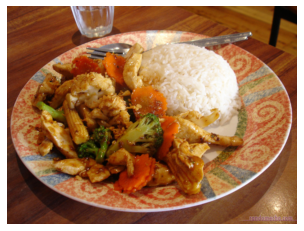

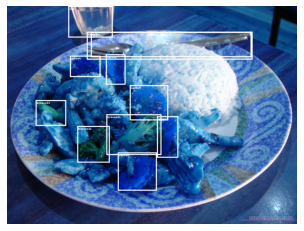

Category name to check:  broccoli
Our Model
Category:  cup  ; Correctness:  [False]
Category:  fork  ; Correctness:  [False]
Category:  broccoli  ; Correctness:  [True, False, True]
Category:  carrot  ; Correctness:  [True, True, True, False, True]
Category:  spoon  ; Correctness:  [False]

OVR-CNN
Category:  cup  ; Correctness:  [False]
Category:  fork  ; Correctness:  [False]
Category:  broccoli  ; Correctness:  [True, True, True]
Category:  carrot  ; Correctness:  [False, False, False, False, False]
Category:  spoon  ; Correctness:  [False]
cup tensor([2.2582e+02, 8.5333e-02, 3.8809e+02, 1.1546e+02])
fork tensor([293.0434,  94.4000, 902.6462, 196.6080])
broccoli tensor([258.2918, 440.3627, 377.7904, 574.8267])
broccoli tensor([365.1050, 397.3760, 567.0694, 546.9867])
broccoli tensor([105.3421, 345.7707, 217.9757, 439.6374])
carrot tensor([407.3186, 537.0453, 550.8448, 677.9733])
carrot tensor([551.1860, 404.7147, 629.9420, 556.9280])
carrot tensor([363.9324, 177.3653, 435.3331, 288.

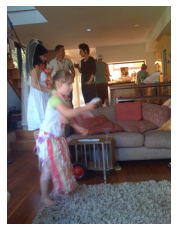

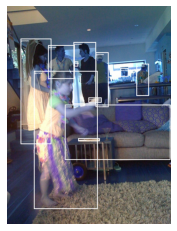

Category name to check:  couch
Our Model
Category:  couch  ; Correctness:  [False]
Category:  person  ; Correctness:  [False, False, False, False, False, False, False]
Category:  cup  ; Correctness:  [False]
Category:  remote  ; Correctness:  [True, False]

OVR-CNN
Category:  couch  ; Correctness:  [False]
Category:  person  ; Correctness:  [False, False, False, False, False, False, False]
Category:  cup  ; Correctness:  [False]
Category:  remote  ; Correctness:  [True, False]
couch tensor([282.1547, 482.5995, 797.8667, 752.8732])
person tensor([ 66.6880, 159.6655, 216.8960, 675.8654])
person tensor([631.4454, 282.0636, 692.4160, 439.3199])
person tensor([200.4267, 191.2830, 330.5173, 356.5344])
cup tensor([328.4267, 271.1478, 347.8614, 295.3672])
remote tensor([397.8454, 447.2083, 461.0774, 472.5791])
remote tensor([347.2640, 646.6782, 452.7787, 661.3464])
person tensor([324.8427, 176.5083, 434.7520, 479.1457])
person tensor([432.2347, 226.3971, 495.7440, 494.4535])
person tensor([131

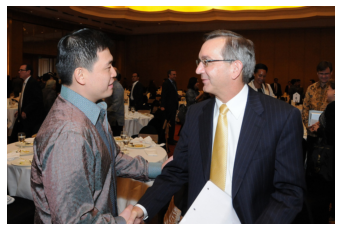

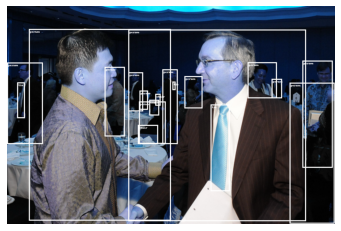

Category name to check:  tie
Our Model
Category:  tie  ; Correctness:  [True, False, False]
Category:  person  ; Correctness:  [False, False, False, True, False, False, True, False, False, True, False, False, False]
Category:  chair  ; Correctness:  [False, False, False]

OVR-CNN
Category:  tie  ; Correctness:  [False, True, False]
Category:  person  ; Correctness:  [False, False, False, True, False, True, True, False, False, False, False, True, False]
Category:  chair  ; Correctness:  [False, False, False]
tie tensor([747.4206, 361.3553, 817.4219, 679.4730])
person tensor([ 445.5741,   86.2871, 1097.6906,  789.1200])
person tensor([ 80.8561,  84.6118, 601.8120, 787.4448])
person tensor([486.0210, 310.9270, 517.1556, 380.5176])
person tensor([570.3198, 232.0565, 626.1929, 506.4659])
person tensor([883.1528, 206.4941, 990.7604, 338.4282])
person tensor([1084.4089,  200.4706, 1195.8541,  593.2047])
person tensor([  0.0000, 207.9812, 131.0667, 506.3341])
person tensor([484.9486, 350.2494,

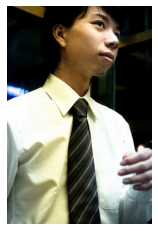

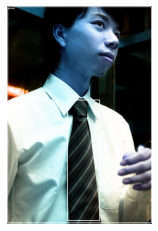

Category name to check:  tie
Our Model
Category:  tie  ; Correctness:  [True]
Category:  person  ; Correctness:  [False]

OVR-CNN
Category:  tie  ; Correctness:  [True]
Category:  person  ; Correctness:  [False]
tie tensor([ 332.9882,  517.4566,  512.4894, 1186.5608])
person tensor([   2.7106,    2.7090,  798.1177, 1199.4098])


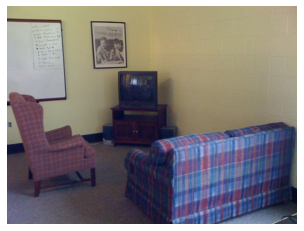

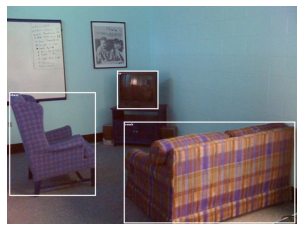

Category name to check:  tv
Our Model
Category:  tv  ; Correctness:  [True]
Category:  couch  ; Correctness:  [False]
Category:  chair  ; Correctness:  [False]

OVR-CNN
Category:  tv  ; Correctness:  [True]
Category:  couch  ; Correctness:  [False]
Category:  chair  ; Correctness:  [False]
tv tensor([404.6963, 237.1840, 556.1962, 378.8587])
couch tensor([ 429.7686,  424.3627, 1059.3481,  797.8667])
chair tensor([  8.9331, 316.9494, 326.9635, 696.0214])


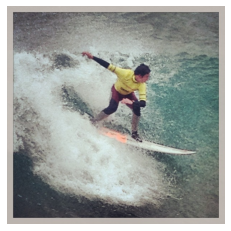

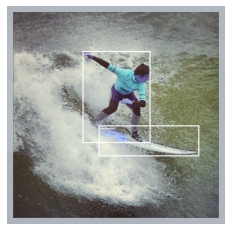

Category name to check:  person
Our Model
Category:  person  ; Correctness:  [False]
Category:  surfboard  ; Correctness:  [False]

OVR-CNN
Category:  person  ; Correctness:  [False]
Category:  surfboard  ; Correctness:  [True]
person tensor([277.2418, 165.7516, 526.1960, 502.4706])
surfboard tensor([336.4706, 438.6536, 705.6340, 551.8824])


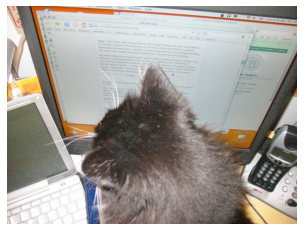

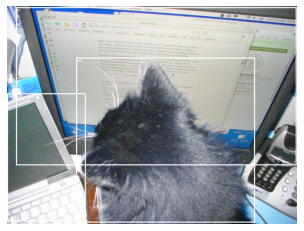

Category name to check:  cat
Our Model
Category:  cat  ; Correctness:  [False]
Category:  laptop  ; Correctness:  [False]
Category:  tv  ; Correctness:  [False]

OVR-CNN
Category:  cat  ; Correctness:  [True]
Category:  laptop  ; Correctness:  [False]
Category:  tv  ; Correctness:  [False]
cat tensor([254.4575, 189.2500, 911.3134, 794.9000])
laptop tensor([  0.0000, 320.0000, 289.3857, 789.3500])
tv tensor([  33.2292,    4.1500, 1064.3344,  584.3000])


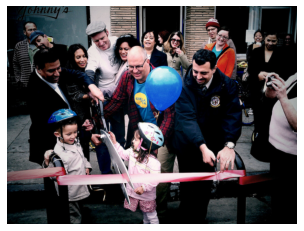

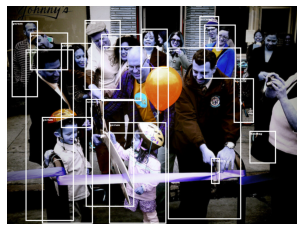

Category name to check:  scissors
Our Model
Category:  scissors  ; Correctness:  [False, False]
Category:  person  ; Correctness:  [True, False, False, False, False, False, False, False, False, False, False, False, False]
Category:  handbag  ; Correctness:  [False]
Category:  bicycle  ; Correctness:  [False]

OVR-CNN
Category:  scissors  ; Correctness:  [False, False]
Category:  person  ; Correctness:  [True, False, False, False, False, False, False, True, False, False, False, False, False]
Category:  handbag  ; Correctness:  [False]
Category:  bicycle  ; Correctness:  [False]
scissors tensor([289.2524, 341.2667, 467.2578, 736.9166])
person tensor([ 17.9721,  54.3833, 113.3125, 334.9667])
person tensor([375.4985, 426.0667, 585.8336, 798.3333])
person tensor([128.6695, 407.6000, 315.7192, 798.0333])
person tensor([ 68.4239, 159.4667, 245.0301, 788.4166])
person tensor([198.5925, 135.7333, 312.2880, 447.6833])
person tensor([ 84.6304,  97.5833, 224.0099, 235.8667])
person tensor([285.138

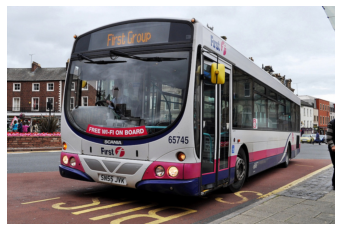

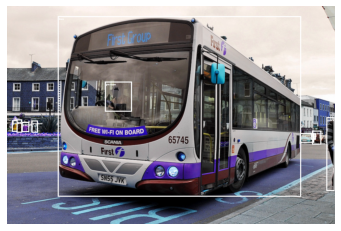

Category name to check:  bus
Our Model
Category:  bus  ; Correctness:  [True]
Category:  car  ; Correctness:  [False, False]
Category:  person  ; Correctness:  [False, False, False, False, False, False, False]

OVR-CNN
Category:  bus  ; Correctness:  [True]
Category:  car  ; Correctness:  [False, False]
Category:  person  ; Correctness:  [False, False, False, False, False, False, False]
bus tensor([ 186.8646,   37.7600, 1079.7246,  699.2377])
car tensor([1076.9780,  466.9553, 1127.0569,  501.4212])
person tensor([ 54.5186, 425.8447,  81.1947, 462.9270])
person tensor([ 35.2546, 416.2447,  55.2899, 464.5271])
person tensor([ 18.2105, 419.2188,  38.7537, 461.3083])
person tensor([1120.4161,  457.0541, 1153.1311,  508.9318])
person tensor([359.7138, 277.2894, 458.1220, 387.5200])
person tensor([ 90.8832, 420.5741, 113.1948, 464.5271])
person tensor([1172.0940,  408.7529, 1202.1188,  678.7576])
car tensor([1115.2427,  467.6894, 1133.7917,  490.7106])


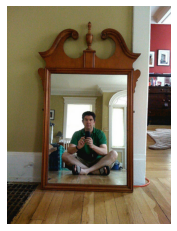

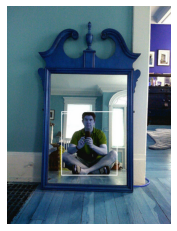

Category name to check:  person
Our Model
Category:  person  ; Correctness:  [True]

OVR-CNN
Category:  person  ; Correctness:  [True]
person tensor([265.3167, 515.5109, 538.9167, 828.4819])


In [133]:
num_samples = 50
count = 0
phase = '1'
with torch.no_grad():
    for iteration_val, (images_val, targets_val, _) in enumerate(data_loader):
        caps, dets = zip(*targets_val)
        det_classes = [det.get_field("labels") for det in dets]
        
        is_second_phase = False
        cls_to_chk = -1
        for cl in det_classes[0]:
            if cl in objects_by_phases[phase]:
                is_second_phase=True
                cls_to_chk = cl
                break
        
        if not is_second_phase:
            continue
            
        if count >= num_samples:
            break
            
        images_val = images_val.to(device)
        try:
            targets_val = [target.to(device) for target in targets_val]
        except:
            pass
        acc_dict, topk_acc_dict, y_true, y_probs = model(images_val, targets_val)
        acc_dict_no_cur, _, _, _ = model_no_cur(images_val, targets_val)
        
        cls_to_chk = str(cls_to_chk.item())
#         if acc_dict[cls_to_chk][0].item() == True and acc_dict[cls_to_chk][0].item() == False:
        det_names = [cat_id2name[contiguous_id2cat_id[dc.item()]] for dc in det_classes[0]]
        viz_img_and_bbox(images_val.tensors[0].to('cpu'), dets[0].bbox, det_names)
        print('Category name to check: ', cat_id2name[contiguous_id2cat_id[int(cls_to_chk)]])
        print('Our Model')
        for k, v in acc_dict.items():
            v = [v_i.item() for v_i in v]
            print('Category: ', cat_id2name[contiguous_id2cat_id[int(k)]], ' ; Correctness: ', v)
        print('\nOVR-CNN')
        for k, v in acc_dict_no_cur.items():
            v = [v_i.item() for v_i in v]
            print('Category: ', cat_id2name[contiguous_id2cat_id[int(k)]], ' ; Correctness: ', v)
        for idx in range(len(det_names)):
            print(det_names[idx], dets[0].bbox[idx])
        count += 1

In [19]:
with open('../data/coco/coco_stats/objects_by_phases.json') as f:
    objects_names_by_phases = json.load(f)

objects_names_by_phases

{'1': ['toilet',
  'bicycle',
  'apple',
  'train',
  'laptop',
  'carrot',
  'motorcycle',
  'oven',
  'chair',
  'boat',
  'kite',
  'sheep',
  'horse',
  'sandwich',
  'clock',
  'tv',
  'backpack',
  'toaster',
  'bowl',
  'microwave',
  'bench',
  'book',
  'orange',
  'bird',
  'pizza',
  'frisbee',
  'bear',
  'vase',
  'toothbrush',
  'giraffe',
  'broccoli',
  'refrigerator',
  'remote',
  'surfboard',
  'car',
  'bed',
  'banana',
  'donut',
  'person',
  'truck',
  'bottle',
  'suitcase',
  'zebra',
  'umbrella',
  'cow',
  'bus',
  'keyboard',
  'skateboard',
  'dog',
  'couch',
  'tie',
  'sink',
  'elephant',
  'cake',
  'scissors',
  'airplane',
  'cat',
  'knife'],
 '2': ['mouse', 'fork', 'spoon', 'handbag', 'skis', 'cup', 'snowboard']}